In [1]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score as r
from sklearn.metrics import accuracy_score as a




In [3]:
import nltk
import re

# Define the path to your CSV file on Google Drive
file_path = '/content/mal_full_offensive_train.csv'

# Load the CSV data into a DataFrame
df = pd.read_csv(file_path)

# Import NLTK and download the necessary resources
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

**Preprocessing**

In [4]:
df

,പലദേശം. പല ഭാഷ ഒരേ ഒരു രാജാവ് അല്ലാതെ സ്വന്തം രാജവയത് അല്ല\tNot_offensive\t
0,ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...
1,ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...
2,Sushin syam Shaiju khalid Midhun manual\tNot...
3,J A K E S. B EJ O Y !!!\tNot_offensive\t
4,Pwoli item padam kananda ennu karuthiyatha pak...
...,...
16004,കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...
16005,ente mammookka ningal puliyalla oru simhama......
16006,Lucifer mass dialogues Ellam onnu comment chey...
16007,Like from Madurai (Tamil nadu) ....\tnot-malay...


In [5]:
data=df

In [6]:
# Create a new DataFrame without column names
data_without_columns = pd.DataFrame(data.values)

In [7]:
data=data_without_columns

In [8]:

# Set the column name to "text"
data.columns = ["text"]

In [9]:
data

,text
0,ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...
1,ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...
2,Sushin syam Shaiju khalid Midhun manual\tNot...
3,J A K E S. B EJ O Y !!!\tNot_offensive\t
4,Pwoli item padam kananda ennu karuthiyatha pak...
...,...
16004,കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...
16005,ente mammookka ningal puliyalla oru simhama......
16006,Lucifer mass dialogues Ellam onnu comment chey...
16007,Like from Madurai (Tamil nadu) ....\tnot-malay...


In [10]:
df=data
df


,text
0,ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...
1,ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...
2,Sushin syam Shaiju khalid Midhun manual\tNot...
3,J A K E S. B EJ O Y !!!\tNot_offensive\t
4,Pwoli item padam kananda ennu karuthiyatha pak...
...,...
16004,കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...
16005,ente mammookka ningal puliyalla oru simhama......
16006,Lucifer mass dialogues Ellam onnu comment chey...
16007,Like from Madurai (Tamil nadu) ....\tnot-malay...


In [11]:
import pandas as pd

# Assuming you have a DataFrame named 'df' with a column containing tab-separated values
split_df = df['text'].str.split('\t', expand=True)

# Check the structure of the DataFrame created after splitting
print(split_df.head())

# Now, rename the columns to "text" and "sentiment" if necessary
if split_df.shape[1] == 2:
    split_df.columns = ["text", "sentiment"]
else:
    print("The DataFrame created after splitting does not have 2 columns.")

# Now, split_df contains the "text" and "sentiment" columns without NaN values


                                                   0              1 2
0  ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...  Not_offensive  
1  ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...  Not_offensive  
2          Sushin syam  Shaiju khalid  Midhun manual  Not_offensive  
3                          J A K E S.   B EJ O Y !!!  Not_offensive  
4  Pwoli item padam kananda ennu karuthiyatha pak...  Not_offensive  
The DataFrame created after splitting does not have 2 columns.


In [12]:
split_df

,0,1,2
0,ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...,Not_offensive,
1,ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...,Not_offensive,
2,Sushin syam Shaiju khalid Midhun manual,Not_offensive,
3,J A K E S. B EJ O Y !!!,Not_offensive,
4,Pwoli item padam kananda ennu karuthiyatha pak...,Not_offensive,
...,...,...,...
16004,കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...,Not_offensive,
16005,ente mammookka ningal puliyalla oru simhama......,Not_offensive,
16006,Lucifer mass dialogues Ellam onnu comment chey...,Not_offensive,
16007,Like from Madurai (Tamil nadu) ....,not-malayalam,


In [13]:
# Save the split_df DataFrame to a CSV file
split_df.to_csv('split_data_label_offensive.csv', index=False)


In [14]:
data=split_df

In [15]:
# Assuming you have a DataFrame named 'data'
data = pd.read_csv('split_data_label_offensive.csv', names=["text", "sentiment", "Column3"])

# Print the column names
print(data.columns)
data

Index(['text', 'sentiment', 'Column3'], dtype='object')


,text,sentiment,Column3
0,0,1,2.0
1,ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...,Not_offensive,NaN
2,ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...,Not_offensive,NaN
3,Sushin syam Shaiju khalid Midhun manual,Not_offensive,NaN
4,J A K E S. B EJ O Y !!!,Not_offensive,NaN
...,...,...,...
16005,കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...,Not_offensive,NaN
16006,ente mammookka ningal puliyalla oru simhama......,Not_offensive,NaN
16007,Lucifer mass dialogues Ellam onnu comment chey...,Not_offensive,NaN
16008,Like from Madurai (Tamil nadu) ....,not-malayalam,NaN


In [16]:
# Assuming 'data' is your DataFrame
data = data.iloc[1:]  # This will remove the first row
data

,text,sentiment,Column3
1,ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...,Not_offensive,NaN
2,ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...,Not_offensive,NaN
3,Sushin syam Shaiju khalid Midhun manual,Not_offensive,NaN
4,J A K E S. B EJ O Y !!!,Not_offensive,NaN
5,Pwoli item padam kananda ennu karuthiyatha pak...,Not_offensive,NaN
...,...,...,...
16005,കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...,Not_offensive,NaN
16006,ente mammookka ningal puliyalla oru simhama......,Not_offensive,NaN
16007,Lucifer mass dialogues Ellam onnu comment chey...,Not_offensive,NaN
16008,Like from Madurai (Tamil nadu) ....,not-malayalam,NaN


Converting "text" coloum as vectors and "sentiment" coloum as labels.

In [17]:
import pandas as pd

unique_labels = data['sentiment'].unique()

for label in unique_labels:
    print(label)
# Print the number of instances of each label
label_counts = data['sentiment'].value_counts()

print("\nNumber of instances for each label:")
print(label_counts)

Not_offensive
Offensive_Targeted_Insult_Individual
not-malayalam
Offensive_Targeted_Insult_Group
Offensive_Untargetede

Number of instances for each label:
sentiment
Not_offensive                           14152
not-malayalam                            1287
Offensive_Targeted_Insult_Individual      239
Offensive_Untargetede                     191
Offensive_Targeted_Insult_Group           140
Name: count, dtype: int64


In [18]:
import pandas as pd

# Assuming your DataFrame is named 'data' and contains a 'sentiment' column and a 'text' column
unique_labels = data['sentiment'].unique()

for label in unique_labels:
    print(f"Label: {label}")
    label_data = data[data['sentiment'] == label]
    text_column = label_data['text']
    print(text_column)
    print('\n')



Label: Not_offensive
1        ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...
2        ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...
3                Sushin syam  Shaiju khalid  Midhun manual
4                                J A K E S.   B EJ O Y !!!
5        Pwoli item padam kananda ennu karuthiyatha pak...
                               ...                        
16004    ഈ ഓണത്തിന് എങ്ങനെ മുണ്ട് എളുപ്പത്തിൽ ഉടുക്കാം ...
16005    കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...
16006    ente mammookka ningal puliyalla oru simhama......
16007    Lucifer mass dialogues Ellam onnu comment chey...
16009    അടിമകൾ ആയി ജീവിച്ചു മാറിക്കയല്ല ചാവേറായി ചാവാറ...
Name: text, Length: 14152, dtype: object


Label: Offensive_Targeted_Insult_Individual
23                        Jobi jorge padam ano. Potti mone
46       Nth bhashayado ith vech ketti malabr bhasha sa...
111      Iyyalkke rest cheyyanulla time aayilla.. kanda...
428      Al veruppikkal Mammotty ude vere oru adipoli v...
466    

In [19]:

import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Sample data with unique labels
#data = pd.DataFrame({'sentiment': [ 'Not_offensive', 'Offensive_Targeted_Insult_Individual', 'not-malayalam', 'Offensive_Targeted_Insult_Group', 'Offensive_Untargetede']})

# Extract the 'sentiment' column
unique_labels = data['sentiment']

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the labels
y_encoded = label_encoder.fit_transform(unique_labels)

# Print the unique labels and their corresponding encoded values
for label, encoded_value in zip(unique_labels, y_encoded):
    print(f"Label: {label}, Encoded Value: {encoded_value}")

# If you want to store the encoded values in the DataFrame, you can do:
data['y_encoded'] = y_encoded
print(data)


Streaming output truncated to the last 5000 lines.
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: not-malayalam, Encoded Value: 4
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Not_offensive, Encoded Value: 0
Label: Offens

<ipython-input-19-1ae73ce5f8e4>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['y_encoded'] = y_encoded


In [20]:
y_encoded.shape

(16009,)

In [21]:
y_encoded


array([0, 0, 0, ..., 0, 4, 0])

In [22]:
y=y_encoded

# Assuming 'y' is your target variable
unique_values = np.unique(y)

# Print the unique values
print(unique_values)

[0 1 2 3 4]


In [23]:
from collections import Counter

label_counts = Counter(y)

for label, count in label_counts.items():
    print(f"Label {label}: {count} times")


Label 0: 14152 times
Label 2: 239 times
Label 4: 1287 times
Label 1: 140 times
Label 3: 191 times


In [24]:
#label 0 = not offensive
#label 1 = offensive targeted insulted group
#label 2 = offensive targeted insulted individual
#label 3 = Offensive Untargeted
#label 4 = not malayalam



In [25]:
df["text"][0]

'ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവർ ലൈക്\u200c അടി\tNot_offensive\t'

In [26]:
import pandas as pd

# Assuming df is your DataFrame containing the "text" column

# Iterate through each element in the "text" column and remove everything after "\t"
for i in range(len(df["text"])):
    df["text"][i] = df["text"][i].split("\t")[0]

# Alternatively, you can use list comprehension:
# df["text"] = [text.split("\t")[0] for text in df["text"]]

# Display the modified DataFrame
print(df)


                                                    text
0      ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവ...
1      ആരണ്ട ആരണ്ട തലുണ്ടാകാണാ ആരണ്ട ഞാൻ ആണ്ട ഞാൻ ആണ്...
2              Sushin syam  Shaiju khalid  Midhun manual
3                              J A K E S.   B EJ O Y !!!
4      Pwoli item padam kananda ennu karuthiyatha pak...
...                                                  ...
16004  കട്ട ലാലേട്ടൻ ഫാൻസിന് ദൈവത്തെ ഓർത്ത് അമിത പ്രത...
16005  ente mammookka ningal puliyalla oru simhama......
16006  Lucifer mass dialogues Ellam onnu comment chey...
16007                Like from Madurai (Tamil nadu) ....
16008  അടിമകൾ ആയി ജീവിച്ചു മാറിക്കയല്ല ചാവേറായി ചാവാറ...

[16009 rows x 1 columns]


In [27]:
df["text"][0]

'ഈ ഓണം ഏട്ടനും പിള്ളേർക്ക് ഉള്ളതാണ് എന്ന് ഉള്ളവർ ലൈക്\u200c അടി'

random under sampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

# Instantiate the RandomUnderSampler
undersampler = RandomUnderSampler(random_state=42)

# Perform random undersampling
X_resampled, y_resampled = undersampler.fit_resample(df["text"].values.reshape(-1, 1), y_encoded)

# Check the class distribution after undersampling
from collections import Counter

label_counts_resampled = Counter(y_resampled)

for label, count in label_counts_resampled.items():
    print(f"Label {label}: {count} times")


Label 0: 140 times
Label 1: 140 times
Label 2: 140 times
Label 3: 140 times
Label 4: 140 times


Without Random undersampling

In [28]:
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler

# Split the dataset into train and test sets
x_train, x_test, y_train, y_test = train_test_split(df['text'], y_encoded, test_size=0.2, random_state=42)


# Check the class distribution after undersampling
from collections import Counter

label_counts_resampled = Counter(y_train)

for label, count in label_counts_resampled.items():
    print(f"Label {label}: {count} times")


Label 0: 11276 times
Label 4: 1064 times
Label 1: 109 times
Label 2: 200 times
Label 3: 158 times


In [ ]:
type(X_resampled[1])

NameError: name 'X_resampled' is not defined

In [ ]:
y_resampled.shape

NameError: name 'y_resampled' is not defined

split train test

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Split the dataset into training and testing sets
x_train, x_test,y_train,y_test = train_test_split(X_resampled,y_resampled,test_size=0.2, random_state=42)

# Assuming you want to scale your features
# scaler = MinMaxScaler()
# x_train_scaled = scaler.fit_transform(x_train)
# x_test_scaled = scaler.transform(x_test)

In [29]:
x_train.shape

(12807,)

In [30]:
type(x_train[1])

str

In [31]:
x_test.shape

(3202,)

In [32]:
y_train.shape

(12807,)

In [33]:
y_test.shape

(3202,)

In [34]:
pip install lazypredict


In [35]:
from lazypredict.Supervised import LazyClassifier

In [36]:
!pip install transformers


In [37]:
pip install sentencepiece


In [38]:
pip install transformers torch -U


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.8/8.8 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 1.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinu

In [39]:
!pip install tokenizers


Bert Models

In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from transformers import BertTokenizer, BertModel
import torch
from torch.utils.data import DataLoader
from tqdm import tqdm



BERT BASE MULTILINGUAL UNCASED

In [41]:
# Load pre-trained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-uncased')
model = BertModel.from_pretrained('bert-base-multilingual-uncased')




tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/872k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.72M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/672M [00:00<?, ?B/s]

In [42]:
# Function to tokenize and get embeddings for a batch of text pairs
def get_bert_embeddings_batch(text_pairs):
    inputs = tokenizer(text_pairs, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = torch.mean(outputs.last_hidden_state, dim=1)
    return embeddings




In [43]:
# Assuming x_train is a Pandas Series containing text data
x_train = x_train.to_numpy()  # Convert Pandas Series to NumPy array
# Assuming x_test is a Pandas Series containing text data
x_test = x_test.to_numpy()  # Convert Pandas Series to NumPy array

In [44]:
# Set batch size
batch_size = 8

# Tokenize and get embeddings for each text in batches
embeddings = []
for i in tqdm(range(0, len(x_train), batch_size)):
    batch_texts = x_train[i:i+batch_size].reshape(-1, 1).tolist()
    # Convert batch_texts to list of texts
    texts = [text[0] for text in batch_texts]
    batch_embedding = get_bert_embeddings_batch(texts)
    embeddings.append(batch_embedding.numpy())


100%|██████████| 1601/1601 [42:26<00:00,  1.59s/it]


INDIC BERT

In [ ]:
from transformers import AutoTokenizer, AutoModel
# Load the tokenizer and model
tokenizer = AutoTokenizer.from_pretrained("ai4bharat/indic-bert")
model = AutoModel.from_pretrained("ai4bharat/indic-bert")

config.json:   0%|          | 0.00/507 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/5.65M [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/135M [00:00<?, ?B/s]

In [ ]:
# Function to tokenize and get embeddings for a batch of text pairs
def get_bert_embeddings_batch(text_pairs):
    inputs = tokenizer(text_pairs, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = torch.mean(outputs.last_hidden_state, dim=1)
    return embeddings




In [ ]:
# Set batch size
batch_size = 8

# Tokenize and get embeddings for each text in batches
Indic_embeddings = []
for i in tqdm(range(0, len(x_train), batch_size)):
    batch_texts = x_train[i:i+batch_size].reshape(-1, 1).tolist()
    # Convert batch_texts to list of texts
    texts = [text[0] for text in batch_texts]
    batch_embedding = get_bert_embeddings_batch(texts)
    Indic_embeddings.append(batch_embedding.numpy())


100%|██████████| 70/70 [01:26<00:00,  1.24s/it]


for test data Indic bert

In [ ]:
# Set batch size
batch_size = 8

# Tokenize and get embeddings for each text in batches
Indic_embeddings_test = []
for i in tqdm(range(0, len(x_test), batch_size)):
    batch_texts = x_test[i:i+batch_size].reshape(-1, 1).tolist()
    # Convert batch_texts to list of texts
    texts = [text[0] for text in batch_texts]
    batch_embedding = get_bert_embeddings_batch(texts)
    Indic_embeddings_test.append(batch_embedding.numpy())


100%|██████████| 18/18 [00:26<00:00,  1.49s/it]


In [ ]:
# Convert the list of embeddings to a NumPy array
Indic_bert_test = np.concatenate(Indic_embeddings_test, axis=0)
Indic_bert_train = np.concatenate(Indic_embeddings, axis=0)

In [ ]:
Indic_bert_test=
Indic_bert_train=

In [ ]:
Indic_bert_train.shape

(560, 768)

In [ ]:
Indic_bert_test.shape

(140, 768)

Classifier for Indic Bert

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(Indic_bert_train,Indic_bert_test,y_train,y_test)
models

 97%|█████████▋| 28/29 [00:41<00:03,  3.99s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 143616
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 768
[LightGBM] [Info] Start training from score -1.683546
[LightGBM] [Info] Start training from score -1.600549
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.583005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

100%|██████████| 29/29 [01:02<00:00,  2.15s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.54,0.57,None,0.51,20.45
SGDClassifier,0.52,0.55,None,0.50,0.21
RandomForestClassifier,0.51,0.53,None,0.49,0.93
XGBClassifier,0.49,0.52,None,0.47,18.34
NuSVC,0.50,0.52,None,0.48,0.21
ExtraTreesClassifier,0.49,0.52,None,0.47,0.32
SVC,0.49,0.51,None,0.46,0.21
Perceptron,0.48,0.50,None,0.46,0.15
CalibratedClassifierCV,0.47,0.50,None,0.45,11.67


LIME FOR INDIC BERT

In [ ]:
import torch
from transformers import BertTokenizer, BertModel
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Load pre-trained BERT model and tokenizer
tokenizer = AutoTokenizer.from_pretrained("ai4bharat/indic-bert")
model = AutoModel.from_pretrained("ai4bharat/indic-bert")

# Function to tokenize and get embeddings for a single text
def get_bert_embeddings(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = torch.mean(outputs.last_hidden_state, dim=1)
    return embeddings.numpy()

# Initialize the Logistic Regression classifier
log_reg_classifier = LogisticRegression()

# Train the classifier on your training data (bert_train, y_train)
log_reg_classifier.fit(Indic_bert_train, y_train)
# Define a predict function
def predict(text):
    # Get BERT embeddings for the text
    text_embedding = get_bert_embeddings(text)
    # Predict using the trained logistic regression classifier
    prediction = log_reg_classifier.predict(text_embedding)
    return prediction




In [ ]:
class_names = ['not offensive','off tar grp','off tar ind','off unt','not mal']

In [ ]:
from lime.lime_text import LimeTextExplainer

# Initialize LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)  # Replace class names accordingly

# Define the function to get predictions for a given text
def predict_proba(texts):
    # Get BERT embeddings for the text
    embeddings = get_bert_embeddings(texts)
    # Predict probabilities using the trained logistic regression classifier
    probabilities = log_reg_classifier.predict_proba(embeddings)
    return probabilities

# Define the text to predict
text_to_predict = "Jobi jorge padam ano. Potti mone"
predicted_class = predict_proba(text_to_predict)
print("Predicted class:", predicted_class)


Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


Predicted class: [[0.08774743 0.02341672 0.81043742 0.02500621 0.05339223]]


In [ ]:
# Explain the prediction for the text_to_predict
exp = explainer.explain_instance(text_to_predict, predict_proba, num_features=10,top_labels=5)  # Adjust num_features as needed

# Show the explanation
exp.show_in_notebook(text=True)

In [ ]:
from lime.lime_text import LimeTextExplainer

# Initialize LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)  # Replace class names accordingly

# Define the function to get predictions for a given text
def predict_proba(texts):
    # Get BERT embeddings for the text
    embeddings = get_bert_embeddings(texts)
    # Predict probabilities using the trained logistic regression classifier
    probabilities = log_reg_classifier.predict_proba(embeddings)
    return probabilities

# Define the text to predict
text_to_predict = "Avan oru nallavan anu"
predicted_class = predict_proba(text_to_predict)
print("Predicted class:", predicted_class)


Predicted class: [[0.06195537 0.00556911 0.12450975 0.7931802  0.01478557]]


In [ ]:
# Explain the prediction for the text_to_predict
exp = explainer.explain_instance(text_to_predict, predict_proba, num_features=10,top_labels=5)  # Adjust num_features as needed

# Show the explanation
exp.show_in_notebook(text=True)

for test data Multi-lingual bert

In [45]:
# Set batch size
batch_size = 8


# Tokenize and get embeddings for each text in batches
embeddings_test = []
for i in tqdm(range(0, len(x_test), batch_size)):
    batch_texts = x_test[i:i+batch_size].reshape(-1, 1).tolist()
    # Convert batch_texts to list of texts
    texts = [text[0] for text in batch_texts]
    batch_embedding = get_bert_embeddings_batch(texts)
    embeddings_test.append(batch_embedding.numpy())


100%|██████████| 401/401 [11:05<00:00,  1.66s/it]


In [46]:
len(embeddings)
len(embeddings_test)

401

In [47]:
import numpy as np

# Convert the list of embeddings to a NumPy array
bert_test = np.concatenate(embeddings_test, axis=0)
bert_train = np.concatenate(embeddings, axis=0)


In [48]:
bert_test.shape

(3202, 768)

In [49]:
bert_train.shape

(12807, 768)

In [ ]:
bert_test.shape

(3202, 768)

In [ ]:
y_train.shape

(12807,)

In [ ]:
y_test.shape

(3202,)

In [ ]:
y_resampled.shape

(700,)

In [ ]:
np.unique(y_train)

array([0, 1, 2, 3, 4])

Classifiers for BERT EMBEDDING

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(bert_train,bert_test,y_train,y_test)
models

 97%|█████████▋| 28/29 [21:00<00:37, 37.12s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.397883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195840
[LightGBM] [Info] Number of data points in the train set: 12807, number of used features: 768
[LightGBM] [Info] Start training from score -0.127315
[LightGBM] [Info] Start training from score -4.766399
[LightGBM] [Info] Start training from score -4.159430
[LightGBM] [Info] Start training from score -4.395152
[LightGBM] [Info] Start training from score -2.487957


100%|██████████| 29/29 [22:27<00:00, 46.48s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LogisticRegression,0.93,0.58,None,0.93,5.64
LinearSVC,0.92,0.52,None,0.92,36.14
LinearDiscriminantAnalysis,0.92,0.52,None,0.92,3.73
GaussianNB,0.35,0.49,None,0.45,0.44
NearestCentroid,0.31,0.48,None,0.41,0.41
PassiveAggressiveClassifier,0.92,0.48,None,0.92,4.64
XGBClassifier,0.95,0.47,None,0.94,87.62
DecisionTreeClassifier,0.88,0.46,None,0.89,74.67
LGBMClassifier,0.95,0.46,None,0.94,87.95


Explainable AI using SHAP and LIME

In [50]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=902ac3e1076202f09d773eb32003db4fb5e1b0c21b27fae5585610dcffc068c9
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [51]:
# Import the LimeTabularExplainer module
from lime.lime_tabular import LimeTabularExplainer

In [ ]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Initialize the Logistic Regression classifier
log_reg_classifier = LogisticRegression()

# Train the classifier
log_reg_classifier.fit(bert_train, y_train)

# Predict on the testing data
predictions = log_reg_classifier.predict(bert_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)




Accuracy: 0.9325421611492817


In [52]:
class_names = ['not offensive','off tar grp','off tar ind','off unt','not mal']

In [ ]:

# Import lime module
import lime

LIME FOR WORDS

In [ ]:
import torch
from transformers import BertTokenizer, BertModel
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Load pre-trained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-uncased')
model = BertModel.from_pretrained('bert-base-multilingual-uncased')

# Function to tokenize and get embeddings for a single text
def get_bert_embeddings(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = torch.mean(outputs.last_hidden_state, dim=1)
    return embeddings.numpy()

# Initialize the Logistic Regression classifier
log_reg_classifier = LogisticRegression()

# Train the classifier on your training data (bert_train, y_train)
log_reg_classifier.fit(bert_train, y_train)
# Define a predict function
def predict(text):
    # Get BERT embeddings for the text
    text_embedding = get_bert_embeddings(text)
    # Predict using the trained logistic regression classifier
    prediction = log_reg_classifier.predict(text_embedding)
    return prediction




In [ ]:
# Example usage:
text_to_predict = "Jobi jorge padam ano. Potti mone"
predicted_class = predict(text_to_predict)
print("Predicted class:", predicted_class)

Predicted class: [0]


In [ ]:
from lime.lime_text import LimeTextExplainer

# Initialize LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)  # Replace class names accordingly

# Define the function to get predictions for a given text
def predict_proba(texts):
    # Get BERT embeddings for the text
    embeddings = get_bert_embeddings(texts)
    # Predict probabilities using the trained logistic regression classifier
    probabilities = log_reg_classifier.predict_proba(embeddings)
    return probabilities

# Define the text to predict
text_to_predict = "Jobi jorge padam ano. Potti mone"
predicted_class = predict_proba(text_to_predict)
print("Predicted class:", predicted_class)


Predicted class: [[9.02569214e-01 1.52932114e-06 9.61202881e-02 1.69730959e-06
  1.30727157e-03]]


In [ ]:
# Explain the prediction for the text_to_predict
exp = explainer.explain_instance(text_to_predict, predict_proba, num_features=10,top_labels=5)  # Adjust num_features as needed

# Show the explanation
exp.show_in_notebook(text=True)

In [ ]:
x_test[79]

array(['Jobi jorge padam ano. Potti mone'], dtype=object)

In [ ]:
y_test[79]

2

AUTO ENCODER

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras import Model
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.losses import MeanSquaredLogarithmicError

In [ ]:
auto_train=bert_train
auto_test=bert_test

In [ ]:
print(auto_test)
print(auto_train)

[[-0.2132573  -0.04498734  0.07945497 ... -0.2145151   0.05951814
  -0.34088787]
 [-0.13903667  0.00887022  0.06397185 ... -0.10920125  0.06715181
  -0.43863016]
 [-0.18666673  0.07919926  0.517405   ... -0.21641573  0.58224934
  -0.4563859 ]
 ...
 [-0.10789882  0.05143915  0.3610923  ... -0.08423002  0.37324277
  -0.41010788]
 [-0.5240496  -0.13336223  0.06240496 ... -0.37875673  0.02275447
  -0.37557334]
 [-0.17483714 -0.04707414  0.271713   ... -0.1780062   0.37364268
  -0.13156796]]
[[-0.1269137   0.0789897   0.1480385  ... -0.2804875   0.17975293
  -0.26481608]
 [-0.08407865  0.02500908  0.29422835 ...  0.12484299  0.24383758
  -0.2983862 ]
 [-0.2516412   0.03478663  0.09576719 ... -0.12779295  0.3986036
  -0.27877608]
 ...
 [-0.19934042 -0.15883029  0.06956431 ... -0.28945544  0.26268744
  -0.46667394]
 [-0.17263018  0.13125172  0.15422009 ... -0.16137338  0.21441224
  -0.33946034]
 [-0.26227608 -0.06032795  0.1345838  ... -0.22073664  0.00348296
  -0.21979633]]


In [ ]:
# Assuming you want to scale your features
scaler = MinMaxScaler()
auto_train = scaler.fit_transform(auto_train)
auto_test = scaler.transform(auto_test)

In [ ]:
print(auto_test)
print(auto_train)

[[0.6086618  0.44543737 0.40895367 ... 0.49512482 0.41944814 0.5034418 ]
 [0.66653794 0.50288975 0.3938159  ... 0.58980405 0.425528   0.427094  ]
 [0.6293967  0.577913   0.8371347  ... 0.4934161  0.8357788  0.4132248 ]
 ...
 [0.6908188  0.54829997 0.68430877 ... 0.6122537  0.669315   0.44937313]
 [0.36631033 0.35116374 0.39228398 ... 0.34746826 0.39016762 0.47634852]
 [0.6386212  0.44321126 0.5969232  ... 0.52794707 0.66963345 0.66694427]]
[[0.67599124 0.57768947 0.47600737 ... 0.43581426 0.51520944 0.56286246]
 [0.70939344 0.5201058  0.6189363  ... 0.8002146  0.56624985 0.5366404 ]
 [0.5787305  0.530536   0.42490202 ... 0.5730898  0.6895136  0.5519581 ]
 ...
 [0.6195139  0.32399577 0.39928362 ... 0.42775193 0.5812629  0.40518865]
 [0.64034224 0.6334398  0.48205107 ... 0.54290026 0.54281396 0.50455683]
 [0.5704376  0.42907283 0.46285278 ... 0.48953152 0.37481877 0.59802794]]


In [ ]:
class AutoEncoders(Model):
    def __init__(self, input_shape):
        super(AutoEncoders, self).__init__()
        self.encoder = Sequential([
            Dense(256, activation="relu"),
            Dense(164, activation="relu"),
            Dense(100, activation="relu")
        ])

        self.decoder = Sequential([
            Dense(164, activation="relu"),
            Dense(256, activation="relu"),
            Dense(input_shape, activation="sigmoid")  # Input shape for decoder should be the same as input
        ])

    def call(self, inputs):
        encoded = self.encoder(inputs)
        decoded = self.decoder(encoded)
        return decoded

# Assuming x_train_scaled is a NumPy array
input_shape = auto_train.shape[1]  # Get the number of columns (features)
auto_encoder = AutoEncoders(input_shape=input_shape)

auto_encoder.compile(
    loss='mae',
    metrics=['mae'],
    optimizer='adam'
)

history = auto_encoder.fit(
    auto_train,
    auto_train,
    epochs=15,
    batch_size=32,
    validation_data=(auto_test, auto_test)
)

# Assuming you want to get the encoder layer's output and create a reduced dimension dataframe
encoder_layer = auto_encoder.encoder



Epoch 1/15
401/401 [==============================] - 4s 5ms/step - loss: 0.0722 - mae: 0.0722 - val_loss: 0.0682 - val_mae: 0.0682
Epoch 2/15
401/401 [==============================] - 2s 5ms/step - loss: 0.0654 - mae: 0.0654 - val_loss: 0.0632 - val_mae: 0.0632
Epoch 3/15
401/401 [==============================] - 2s 5ms/step - loss: 0.0624 - mae: 0.0624 - val_loss: 0.0610 - val_mae: 0.0610
Epoch 4/15
401/401 [==============================] - 2s 5ms/step - loss: 0.0606 - mae: 0.0606 - val_loss: 0.0609 - val_mae: 0.0609
Epoch 5/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0593 - mae: 0.0593 - val_loss: 0.0585 - val_mae: 0.0585
Epoch 6/15
401/401 [==============================] - 2s 5ms/step - loss: 0.0581 - mae: 0.0581 - val_loss: 0.0583 - val_mae: 0.0583
Epoch 7/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0570 - mae: 0.0570 - val_loss: 0.0569 - val_mae: 0.0569
Epoch 8/15
401/401 [==============================] - 2s 4ms/step - loss: 0.

In [ ]:
reduced=encoder_layer.predict(auto_train)

401/401 [==============================] - 1s 2ms/step


In [ ]:
reduced_test=encoder_layer.predict(auto_test)

101/101 [==============================] - 0s 3ms/step


In [ ]:
reduced_test.shape

(3202, 100)

In [ ]:
reduced.shape

(12807, 100)

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(reduced,reduced_test,y_train,y_test)
models

 97%|█████████▋| 28/29 [01:39<00:02,  2.83s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006665 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12301
[LightGBM] [Info] Number of data points in the train set: 12807, number of used features: 49
[LightGBM] [Info] Start training from score -0.127315
[LightGBM] [Info] Start training from score -4.766399
[LightGBM] [Info] Start training from score -4.159430
[LightGBM] [Info] Start training from score -4.395152
[LightGBM] [Info] Start training from score -2.487957


100%|██████████| 29/29 [01:43<00:00,  3.58s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LabelPropagation,0.94,0.47,None,0.93,4.91
LabelSpreading,0.94,0.47,None,0.93,10.05
NearestCentroid,0.35,0.45,None,0.46,0.07
ExtraTreesClassifier,0.94,0.45,None,0.93,1.40
DecisionTreeClassifier,0.89,0.44,None,0.89,1.56
XGBClassifier,0.94,0.44,None,0.93,5.90
LGBMClassifier,0.94,0.44,None,0.93,4.69
GaussianNB,0.14,0.42,None,0.18,0.06
QuadraticDiscriminantAnalysis,0.31,0.42,None,0.42,0.17


LIME FOR AUTO ENCODER APPLIED BERT

In [ ]:
import torch
from transformers import BertTokenizer, BertModel
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense

# Load pre-trained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-multilingual-uncased')
model = BertModel.from_pretrained('bert-base-multilingual-uncased')

# Function to tokenize and get embeddings for a single text
def get_bert_embeddings(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True)
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = torch.mean(outputs.last_hidden_state, dim=1)
    return embeddings.numpy()

# Define AutoEncoder model
class AutoEncoder(Model):
    def __init__(self, input_shape):
        super(AutoEncoder, self).__init__()
        self.encoder = Sequential([
            Dense(256, activation="relu"),
            Dense(164, activation="relu"),
            Dense(100, activation="relu")
        ])

        self.decoder = Sequential([
            Dense(164, activation="relu"),
            Dense(256, activation="relu"),
            Dense(input_shape, activation="sigmoid")
        ])

    def call(self, inputs):
        encoded = self.encoder(inputs)
        decoded = self.decoder(encoded)
        return decoded

# Initialize the AutoEncoder
auto_encoder = AutoEncoder(input_shape=768)  # Assuming BERT outputs 768-dimensional vectors

# Compile the AutoEncoder
auto_encoder.compile(loss='mae', optimizer='adam')

# Assuming auto_train and auto_test are the downsampled data
history = auto_encoder.fit(auto_train, auto_train, epochs=15, batch_size=32, validation_data=(auto_test, auto_test))

# Get the encoder layer's output for auto_train and auto_test
encoder_layer = auto_encoder.encoder

# Assuming x_train_scaled is a NumPy array
reduced = encoder_layer.predict(auto_train)
reduced_test = encoder_layer.predict(auto_test)

# Initialize the Logistic Regression classifier
log_reg_classifier = LogisticRegression()

# Train the classifier on your reduced training data
log_reg_classifier.fit(reduced, y_train)

# Define a predict function
def predict(text):
    # Get BERT embeddings for the text
    text_embedding = get_bert_embeddings(text)
    # Get the reduced dimension representation using the encoder
    reduced_embedding = encoder_layer.predict(text_embedding)
    # Predict using the trained logistic regression classifier
    prediction = log_reg_classifier.predict(reduced_embedding)
    return prediction


Epoch 1/15
401/401 [==============================] - 4s 5ms/step - loss: 0.0713 - val_loss: 0.0661
Epoch 2/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0637 - val_loss: 0.0618
Epoch 3/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0608 - val_loss: 0.0593
Epoch 4/15
401/401 [==============================] - 2s 5ms/step - loss: 0.0585 - val_loss: 0.0578
Epoch 5/15
401/401 [==============================] - 2s 5ms/step - loss: 0.0570 - val_loss: 0.0569
Epoch 6/15
401/401 [==============================] - 2s 6ms/step - loss: 0.0558 - val_loss: 0.0557
Epoch 7/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0549 - val_loss: 0.0551
Epoch 8/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0541 - val_loss: 0.0546
Epoch 9/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0534 - val_loss: 0.0536
Epoch 10/15
401/401 [==============================] - 2s 4ms/step - loss: 0.0527 - val_loss: 0.0529

In [ ]:
from lime.lime_text import LimeTextExplainer

# Initialize LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)  # Replace class names accordingly



# Define the text to predict
text_to_predict = "Jobi jorge padam ano. Potti mone"
predicted_class = predict(text_to_predict)
print("Predicted class:", predicted_class)


In [ ]:
from lime.lime_text import LimeTextExplainer

# Initialize LimeTextExplainer
explainer = LimeTextExplainer(class_names=class_names)  # Replace class names accordingly

# Define the function to get predictions for a given text
def predict_proba(texts):
    # Get BERT embeddings for the text
    embeddings = get_bert_embeddings(texts)
    reduced_embedding = encoder_layer.predict(embeddings)
    # Predict probabilities using the trained logistic regression classifier
    probabilities = log_reg_classifier.predict_proba(reduced_embedding)
    return probabilities

# Define the text to predict
text_to_predict = "Jobi jorge padam ano. Potti mone"
predicted_class = predict_proba(text_to_predict)
print("Predicted class:", predicted_class)


In [ ]:
# Explain the prediction for the text_to_predict
exp = explainer.explain_instance(text_to_predict, predict_proba, num_features=10,top_labels=5)  # Adjust num_features as needed

# Show the explanation
exp.show_in_notebook(text=True)

KMEANS

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score

# Initialize variables to track minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value
min_sse = float('inf')
max_silhouette = -1
min_db = float('inf')
max_ari = -1
optimal_k_sse = None
optimal_k_silhouette = None
optimal_k_db = None
optimal_k_ari = None
reduced_train=reduced
k_values=[5]
for k in k_values:
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(reduced_train)

    # Calculate SSE
    sse = kmeans.inertia_

    # Calculate Silhouette Score
    labels = kmeans.labels_
    silhouette = silhouette_score(reduced_train, labels)

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(reduced_train, labels)

    # Calculate ARI
    ari = adjusted_rand_score(y_train, labels)  # Compare cluster labels with ground truth labels

    # Update minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value if needed
    if sse < min_sse:
        min_sse = sse
        optimal_k_sse = k
    if silhouette > max_silhouette:
        max_silhouette = silhouette
        optimal_k_silhouette = k
    if db_index < min_db:
        min_db = db_index
        optimal_k_db = k
    if ari > max_ari:
        max_ari = ari
        optimal_k_ari = k

print(f"Optimal k value based on SSE: {optimal_k_sse}")
print(f"Minimum SSE: {min_sse}")
print(f"Optimal k value based on Silhouette Score: {optimal_k_silhouette}")
print(f"Maximum Silhouette Score: {max_silhouette}")
print(f"Optimal k value based on Davies-Bouldin Index: {optimal_k_db}")
print(f"Minimum Davies-Bouldin Index: {min_db}")
print(f"Optimal k value based on ARI: {optimal_k_ari}")
print(f"Maximum Adjusted Rand Index: {max_ari}")


Optimal k value based on SSE: 5
Minimum SSE: 2828.04296875
Optimal k value based on Silhouette Score: 5
Maximum Silhouette Score: 0.2597081959247589
Optimal k value based on Davies-Bouldin Index: 5
Minimum Davies-Bouldin Index: 1.3293054158088158
Optimal k value based on ARI: 5
Maximum Adjusted Rand Index: 0.15149937833916444


tsne for auto encoder

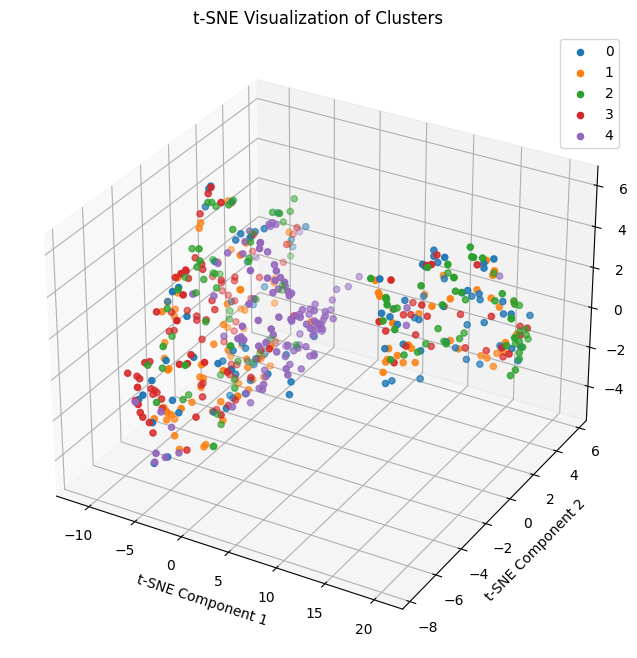

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_features = tsne.fit_transform(reduced)

# Visualize clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in set(y_train):
    indices = (y_train == label)
    ax.scatter(tsne_features[indices, 0], tsne_features[indices, 1], tsne_features[indices, 2], label=label)

ax.set_title('t-SNE Visualization of Clusters')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
ax.legend()
plt.show()


kmeans for bert only without auto encoder

In [ ]:
print(bert_train.shape)
print(bert_test.shape)

(560, 768)
(140, 768)


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score

# Initialize variables to track minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value
min_sse = float('inf')
max_silhouette = -1
min_db = float('inf')
max_ari = -1
optimal_k_sse = None
optimal_k_silhouette = None
optimal_k_db = None
optimal_k_ari = None
k_values=[5]
for k in k_values:
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(bert_train)

    # Calculate SSE
    sse = kmeans.inertia_

    # Calculate Silhouette Score
    labels = kmeans.labels_
    silhouette = silhouette_score(bert_train, labels)

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(bert_train, labels)

    # Calculate ARI
    ari = adjusted_rand_score(y_train, labels)  # Compare cluster labels with ground truth labels

    # Update minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value if needed
    if sse < min_sse:
        min_sse = sse
        optimal_k_sse = k
    if silhouette > max_silhouette:
        max_silhouette = silhouette
        optimal_k_silhouette = k
    if db_index < min_db:
        min_db = db_index
        optimal_k_db = k
    if ari > max_ari:
        max_ari = ari
        optimal_k_ari = k

print(f"Optimal k value based on SSE: {optimal_k_sse}")
print(f"Minimum SSE: {min_sse}")
print(f"Optimal k value based on Silhouette Score: {optimal_k_silhouette}")
print(f"Maximum Silhouette Score: {max_silhouette}")
print(f"Optimal k value based on Davies-Bouldin Index: {optimal_k_db}")
print(f"Minimum Davies-Bouldin Index: {min_db}")
print(f"Optimal k value based on ARI: {optimal_k_ari}")
print(f"Maximum Adjusted Rand Index: {max_ari}")


Optimal k value based on SSE: 5
Minimum SSE: 5585.2021484375
Optimal k value based on Silhouette Score: 5
Maximum Silhouette Score: 0.09562400728464127
Optimal k value based on Davies-Bouldin Index: 5
Minimum Davies-Bouldin Index: 2.64284282926551
Optimal k value based on ARI: 5
Maximum Adjusted Rand Index: 0.14547591237113963


tsne for bert only

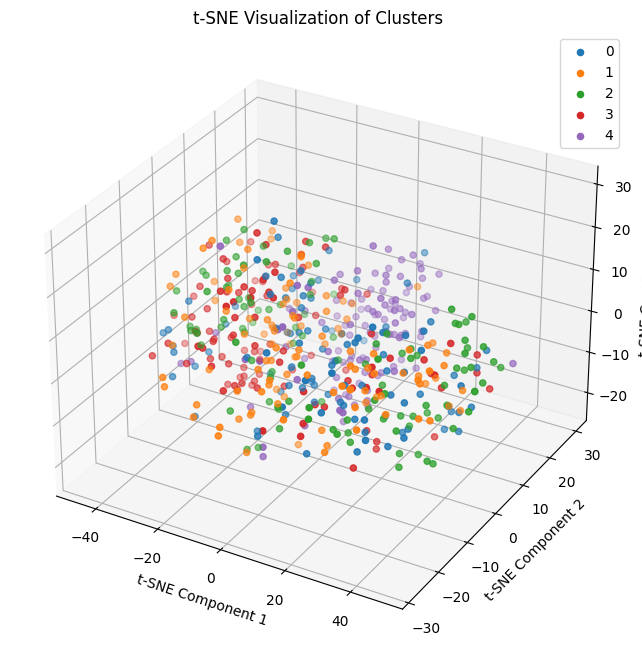

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_features = tsne.fit_transform(bert_train)

# Visualize clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in set(y_train):
    indices = (y_train == label)
    ax.scatter(tsne_features[indices, 0], tsne_features[indices, 1], tsne_features[indices, 2], label=label)

ax.set_title('t-SNE Visualization of Clusters')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
ax.legend()
plt.show()


LSTM

In [53]:
x_train.shape

(12807,)

In [54]:
x_test.shape

(3202,)

In [55]:
y_train.shape

(12807,)

In [56]:
y_test.shape

(3202,)

In [57]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Embedding, Bidirectional

# Assuming X_resampled contains the resampled text data

# Preprocess text data
max_words = 10000  # Maximum number of words to tokenize
max_length = 100  # Maximum length of sequences
embedding_dim = 100  # Dimension of word embeddings

# Convert x_train to a list of strings
x_train_list = x_train.tolist()

# Tokenize text data
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(x_train_list)
sequences = tokenizer.texts_to_sequences(x_train_list)

# Pad sequences to make them all the same length
sequences_padded = pad_sequences(sequences, maxlen=max_length)

# Reshape sequences_padded to include input dimension
sequences_padded_reshaped = np.expand_dims(sequences_padded, axis=-1)

# Define LSTM-based model
lstm_model = Sequential()
lstm_model.add(Bidirectional(LSTM(64), input_shape=(max_length, 1)))  # Adjust the number of units as needed
lstm_model.add(Dense(embedding_dim))  # Output a fixed-size sentence embedding

# Compile the LSTM model
lstm_model.compile(optimizer='adam', loss='mse')  # You can use any appropriate loss function

# Train the LSTM model
lstm_model.fit(sequences_padded_reshaped, np.zeros((len(x_train_list), embedding_dim)), epochs=10, batch_size=32)

# Get sentence embeddings
sentence_embeddings = lstm_model.predict(sequences_padded_reshaped)


Epoch 1/10
401/401 [==============================] - 12s 13ms/step - loss: 0.0024
Epoch 2/10
401/401 [==============================] - 5s 12ms/step - loss: 1.1794e-05
Epoch 3/10
401/401 [==============================] - 6s 14ms/step - loss: 4.6468e-06
Epoch 4/10
401/401 [==============================] - 5s 12ms/step - loss: 3.2659e-06
Epoch 5/10
401/401 [==============================] - 6s 14ms/step - loss: 2.6109e-06
Epoch 6/10
401/401 [==============================] - 5s 12ms/step - loss: 1.6746e-06
Epoch 7/10
401/401 [==============================] - 5s 12ms/step - loss: 1.6051e-06
Epoch 8/10
401/401 [==============================] - 6s 14ms/step - loss: 9.4571e-07
Epoch 9/10
401/401 [==============================] - 5s 12ms/step - loss: 1.4204e-06
Epoch 10/10
401/401 [==============================] - 3s 5ms/step


lstm for x_test

In [58]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Embedding, Bidirectional

# Assuming X_resampled contains the resampled text data

# Preprocess text data
max_words = 10000  # Maximum number of words to tokenize
max_length = 100  # Maximum length of sequences
embedding_dim = 100  # Dimension of word embeddings

# Convert x_train to a list of strings
x_test_list = x_test.tolist()

# Tokenize text data
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(x_test_list)
sequences = tokenizer.texts_to_sequences(x_test_list)

# Pad sequences to make them all the same length
sequences_padded = pad_sequences(sequences, maxlen=max_length)

# Reshape sequences_padded to include input dimension
sequences_padded_reshaped = np.expand_dims(sequences_padded, axis=-1)

# Define LSTM-based model
lstm_model = Sequential()
lstm_model.add(Bidirectional(LSTM(64), input_shape=(max_length, 1)))  # Adjust the number of units as needed
lstm_model.add(Dense(embedding_dim))  # Output a fixed-size sentence embedding

# Compile the LSTM model
lstm_model.compile(optimizer='adam', loss='mse')  # You can use any appropriate loss function

# Train the LSTM model
lstm_model.fit(sequences_padded_reshaped, np.zeros((len(x_test_list), embedding_dim)), epochs=10, batch_size=32)

# Get sentence embeddings
sentence_embeddings_test = lstm_model.predict(sequences_padded_reshaped)


Epoch 1/10
101/101 [==============================] - 5s 13ms/step - loss: 0.0115
Epoch 2/10
101/101 [==============================] - 1s 12ms/step - loss: 1.4268e-04
Epoch 3/10
101/101 [==============================] - 1s 12ms/step - loss: 6.2363e-05
Epoch 4/10
101/101 [==============================] - 1s 12ms/step - loss: 5.1320e-05
Epoch 5/10
101/101 [==============================] - 1s 13ms/step - loss: 1.9985e-05
Epoch 6/10
101/101 [==============================] - 2s 17ms/step - loss: 1.5780e-05
Epoch 7/10
101/101 [==============================] - 1s 14ms/step - loss: 1.5167e-05
Epoch 8/10
101/101 [==============================] - 1s 13ms/step - loss: 5.4469e-06
Epoch 9/10
101/101 [==============================] - 1s 12ms/step - loss: 4.3069e-06
Epoch 10/10
101/101 [==============================] - 2s 7ms/step


In [59]:
sentence_embeddings.shape

(12807, 100)

In [60]:
sentence_embeddings_test.shape

(3202, 100)

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(sentence_embeddings,sentence_embeddings_test,y_train,y_test)
models

 97%|█████████▋| 28/29 [00:10<00:00,  2.20it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18636
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 100
[LightGBM] [Info] Start training from score -1.683546
[LightGBM] [Info] Start training from score -1.600549
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.583005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

100%|██████████| 29/29 [00:12<00:00,  2.30it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
ExtraTreeClassifier,0.23,0.24,None,0.22,0.02
NearestCentroid,0.21,0.23,None,0.18,0.06
AdaBoostClassifier,0.21,0.23,None,0.15,0.38
BernoulliNB,0.19,0.21,None,0.13,0.02
GaussianNB,0.19,0.20,None,0.06,0.01
QuadraticDiscriminantAnalysis,0.18,0.20,None,0.06,0.03
NuSVC,0.18,0.20,None,0.05,0.09
LabelSpreading,0.26,0.20,None,0.11,0.03
LabelPropagation,0.26,0.20,None,0.11,0.02


LIME FOR LSTM

In [63]:
# Define a function to get LSTM embeddings for a given text
def get_lstm_embeddings(text):
    # Preprocess text data
    max_words = 10000  # Maximum number of words to tokenize
    max_length = 100  # Maximum length of sequences
    embedding_dim = 100  # Dimension of word embeddings

    # Tokenize text data
    tokenizer = Tokenizer(num_words=max_words)
    tokenizer.fit_on_texts([text])
    sequence = tokenizer.texts_to_sequences([text])

    # Pad sequence to make it the same length as trained sequences
    sequence_padded = pad_sequences(sequence, maxlen=max_length)

    # Reshape sequence_padded to include input dimension
    sequence_padded_reshaped = np.expand_dims(sequence_padded, axis=-1)

    # Get LSTM embeddings
    lstm_embedding = lstm_model.predict(sequence_padded_reshaped)

    return lstm_embedding[0]  # Remove the batch size dimension

# Define a predict function
def predict(text):
    # Get LSTM embeddings for the text
    text_embedding = get_lstm_embeddings(text)
    # Predict using the trained logistic regression classifier
    prediction = log_reg_classifier.predict([text_embedding])  # Reshape to 2D array
    return prediction

# Define the function to get predictions for a given text
def predict_proba(texts):
    # Get LSTM embeddings for the text
    embeddings = np.array([get_lstm_embeddings(text) for text in texts])
    # Predict probabilities using the trained logistic regression classifier
    probabilities = log_reg_classifier.predict_proba(embeddings)
    return probabilities

# Define the text to predict
text_to_predict = "Jobi jorge padam ano. Potti mone"

# Explain the prediction for the text_to_predict
exp = explainer.explain_instance(text_to_predict, predict_proba, num_features=10, top_labels=5)  # Adjust num_features as needed

# Show the explanation
exp.show_in_notebook(text=True)


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 62ms/step


kmeans for lstm

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score

# Initialize variables to track minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value
min_sse = float('inf')
max_silhouette = -1
min_db = float('inf')
max_ari = -1
optimal_k_sse = None
optimal_k_silhouette = None
optimal_k_db = None
optimal_k_ari = None

for k in k_values:
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(sentence_embeddings)

    # Calculate SSE
    sse = kmeans.inertia_

    # Calculate Silhouette Score
    labels = kmeans.labels_
    silhouette = silhouette_score(sentence_embeddings, labels)

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(sentence_embeddings, labels)

    # Calculate ARI
    ari = adjusted_rand_score(y_train, labels)  # Compare cluster labels with ground truth labels

    # Update minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value if needed
    if sse < min_sse:
        min_sse = sse
        optimal_k_sse = k
    if silhouette > max_silhouette:
        max_silhouette = silhouette
        optimal_k_silhouette = k
    if db_index < min_db:
        min_db = db_index
        optimal_k_db = k
    if ari > max_ari:
        max_ari = ari
        optimal_k_ari = k

print(f"Optimal k value based on SSE: {optimal_k_sse}")
print(f"Minimum SSE: {min_sse}")
print(f"Optimal k value based on Silhouette Score: {optimal_k_silhouette}")
print(f"Maximum Silhouette Score: {max_silhouette}")
print(f"Optimal k value based on Davies-Bouldin Index: {optimal_k_db}")
print(f"Minimum Davies-Bouldin Index: {min_db}")
print(f"Optimal k value based on ARI: {optimal_k_ari}")
print(f"Maximum Adjusted Rand Index: {max_ari}")


Optimal k value based on SSE: 5
Minimum SSE: 0.3418148458003998
Optimal k value based on Silhouette Score: 5
Maximum Silhouette Score: 0.4503006339073181
Optimal k value based on Davies-Bouldin Index: 5
Minimum Davies-Bouldin Index: 0.8596274016300998
Optimal k value based on ARI: 5
Maximum Adjusted Rand Index: 0.008733179209265562


tsne for lstm embedding

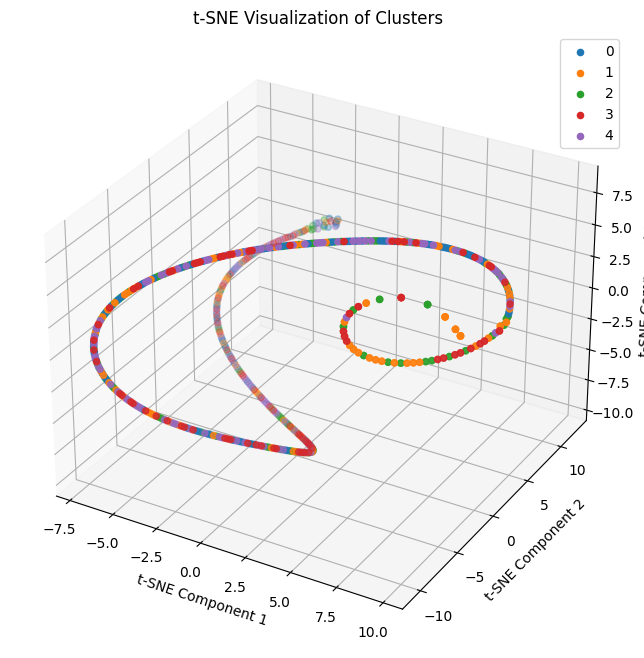

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_features = tsne.fit_transform(sentence_embeddings)

# Visualize clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in set(y_train):
    indices = (y_train == label)
    ax.scatter(tsne_features[indices, 0], tsne_features[indices, 1], tsne_features[indices, 2], label=label)

ax.set_title('t-SNE Visualization of Clusters')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
ax.legend()
plt.show()


bert + Lstm embeddings

In [ ]:
import numpy as np

# Assuming x_train_scaled and reduced are numpy arrays
concatenated_data = np.concatenate((sentence_embeddings, reduced), axis=1)
concatenated_data.shape

(560, 200)

In [ ]:
concatenated_test = np.concatenate((sentence_embeddings_test, reduced_test), axis=1)
concatenated_test.shape

(140, 200)

In [ ]:
# Assuming x_train_scaled and reduced are numpy arrays
add_data = np.add(sentence_embeddings, reduced)
add_data.shape

(560, 100)

In [ ]:
add_data_test = np.add(sentence_embeddings_test, reduced_test)
add_data_test.shape

(140, 100)

classifier for add

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(add_data,add_data_test,y_train,y_test)
models

 97%|█████████▋| 28/29 [00:08<00:00,  2.04it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18669
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 100
[LightGBM] [Info] Start training from score -1.683546
[LightGBM] [Info] Start training from score -1.600549
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.583005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

100%|██████████| 29/29 [00:11<00:00,  2.60it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
XGBClassifier,0.45,0.47,None,0.44,3.96
LGBMClassifier,0.41,0.42,None,0.37,2.35
DecisionTreeClassifier,0.39,0.40,None,0.35,0.06
BernoulliNB,0.38,0.40,None,0.34,0.02
RandomForestClassifier,0.37,0.39,None,0.34,0.48
NearestCentroid,0.38,0.39,None,0.37,0.05
ExtraTreesClassifier,0.33,0.35,None,0.27,0.21
AdaBoostClassifier,0.32,0.34,None,0.24,0.40
BaggingClassifier,0.31,0.32,None,0.30,0.30


In [ ]:
pip install xgboost

In [ ]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import shap
import matplotlib.pyplot as plt

# Initialize the XGBoost classifier
xgb_classifier = XGBClassifier()

# Train the classifier
xgb_classifier.fit(add_data, y_train)

# Predict on the testing data
predictions = xgb_classifier.predict(add_data_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)


ModuleNotFoundError: No module named 'shap'

In [ ]:
# Fit a Decision Tree surrogate model to approximate the XGBoost classifier
surrogate_model = DecisionTreeClassifier(max_depth=3)
surrogate_model.fit(reduced, xgb_classifier.predict(add_data))

# Initialize LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(add_data, class_names=class_names, mode="classification")

# Explain a specific instance using the surrogate model
exp = explainer.explain_instance(add_data_test[48], surrogate_model.predict_proba, top_labels=1)

# Show the explanation
exp.show_in_notebook()


classifier for concatenated

In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(concatenated_data,concatenated_test,y_train,y_test)
models

 97%|█████████▋| 28/29 [00:54<00:08,  8.31s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 27466
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 158
[LightGBM] [Info] Start training from score -1.683546
[LightGBM] [Info] Start training from score -1.600549
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.583005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

100%|██████████| 29/29 [01:03<00:00,  2.20s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
XGBClassifier,0.40,0.43,None,0.34,38.73
AdaBoostClassifier,0.37,0.40,None,0.33,0.87
BernoulliNB,0.37,0.40,None,0.32,0.10
LGBMClassifier,0.34,0.37,None,0.27,9.09
RandomForestClassifier,0.35,0.37,None,0.30,1.40
NearestCentroid,0.34,0.36,None,0.30,0.02
BaggingClassifier,0.34,0.35,None,0.34,0.91
ExtraTreesClassifier,0.33,0.35,None,0.25,0.63
PassiveAggressiveClassifier,0.30,0.29,None,0.27,0.09


LIME FOR CONCATENATED LSTM BERT

In [ ]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Initialize the XGBoost classifier
xgb_classifier = XGBClassifier()

# Train the classifier
xgb_classifier.fit(concatenated_data, y_train)

# Predict on the testing data
predictions = xgb_classifier.predict(concatenated_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)


Accuracy: 0.4


In [ ]:
# Fit a Decision Tree surrogate model to approximate the XGBoost classifier
surrogate_model = DecisionTreeClassifier(max_depth=3)
surrogate_model.fit(concatenated_data, xgb_classifier.predict(concatenated_data))

# Initialize LimeTabularExplainer
explainer = lime.lime_tabular.LimeTabularExplainer(concatenated_data, class_names=class_names, mode="classification")

# Explain a specific instance using the surrogate model
exp = explainer.explain_instance(concatenated_test[48], surrogate_model.predict_proba, top_labels=1)

# Show the explanation
exp.show_in_notebook()


Kmeans for concatenated features

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score

# Initialize variables to track minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value
min_sse = float('inf')
max_silhouette = -1
min_db = float('inf')
max_ari = -1
optimal_k_sse = None
optimal_k_silhouette = None
optimal_k_db = None
optimal_k_ari = None

for k in k_values:
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(concatenated_data)

    # Calculate SSE
    sse = kmeans.inertia_

    # Calculate Silhouette Score
    labels = kmeans.labels_
    silhouette = silhouette_score(concatenated_data, labels)

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(concatenated_data, labels)

    # Calculate ARI
    ari = adjusted_rand_score(y_train, labels)  # Compare cluster labels with ground truth labels

    # Update minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value if needed
    if sse < min_sse:
        min_sse = sse
        optimal_k_sse = k
    if silhouette > max_silhouette:
        max_silhouette = silhouette
        optimal_k_silhouette = k
    if db_index < min_db:
        min_db = db_index
        optimal_k_db = k
    if ari > max_ari:
        max_ari = ari
        optimal_k_ari = k

print(f"Optimal k value based on SSE: {optimal_k_sse}")
print(f"Minimum SSE: {min_sse}")
print(f"Optimal k value based on Silhouette Score: {optimal_k_silhouette}")
print(f"Maximum Silhouette Score: {max_silhouette}")
print(f"Optimal k value based on Davies-Bouldin Index: {optimal_k_db}")
print(f"Minimum Davies-Bouldin Index: {min_db}")
print(f"Optimal k value based on ARI: {optimal_k_ari}")
print(f"Maximum Adjusted Rand Index: {max_ari}")


Optimal k value based on SSE: 5
Minimum SSE: 2829.2978515625
Optimal k value based on Silhouette Score: 5
Maximum Silhouette Score: 0.25961166620254517
Optimal k value based on Davies-Bouldin Index: 5
Minimum Davies-Bouldin Index: 1.3296892695127425
Optimal k value based on ARI: 5
Maximum Adjusted Rand Index: 0.15149937833916444


tsne for feature concateanted

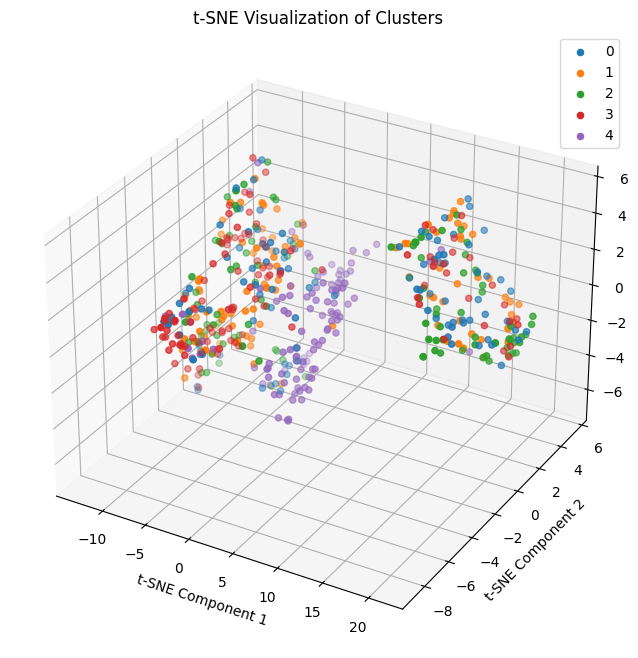

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_features = tsne.fit_transform(concatenated_data)

# Visualize clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in set(y_train):
    indices = (y_train == label)
    ax.scatter(tsne_features[indices, 0], tsne_features[indices, 1], tsne_features[indices, 2], label=label)

ax.set_title('t-SNE Visualization of Clusters')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
ax.legend()
plt.show()


kmeans for adding

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, adjusted_rand_score

# Initialize variables to track minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value
min_sse = float('inf')
max_silhouette = -1
min_db = float('inf')
max_ari = -1
optimal_k_sse = None
optimal_k_silhouette = None
optimal_k_db = None
optimal_k_ari = None

for k in k_values:
    # Perform k-means clustering
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(add_data)

    # Calculate SSE
    sse = kmeans.inertia_

    # Calculate Silhouette Score
    labels = kmeans.labels_
    silhouette = silhouette_score(add_data, labels)

    # Calculate Davies-Bouldin Index
    db_index = davies_bouldin_score(add_data, labels)

    # Calculate ARI
    ari = adjusted_rand_score(y_train, labels)  # Compare cluster labels with ground truth labels

    # Update minimum SSE, maximum Silhouette Score, minimum Davies-Bouldin Index, maximum ARI, and corresponding k value if needed
    if sse < min_sse:
        min_sse = sse
        optimal_k_sse = k
    if silhouette > max_silhouette:
        max_silhouette = silhouette
        optimal_k_silhouette = k
    if db_index < min_db:
        min_db = db_index
        optimal_k_db = k
    if ari > max_ari:
        max_ari = ari
        optimal_k_ari = k

print(f"Optimal k value based on SSE: {optimal_k_sse}")
print(f"Minimum SSE: {min_sse}")
print(f"Optimal k value based on Silhouette Score: {optimal_k_silhouette}")
print(f"Maximum Silhouette Score: {max_silhouette}")
print(f"Optimal k value based on Davies-Bouldin Index: {optimal_k_db}")
print(f"Minimum Davies-Bouldin Index: {min_db}")
print(f"Optimal k value based on ARI: {optimal_k_ari}")
print(f"Maximum Adjusted Rand Index: {max_ari}")


Optimal k value based on SSE: 5
Minimum SSE: 2829.206787109375
Optimal k value based on Silhouette Score: 5
Maximum Silhouette Score: 0.2595774531364441
Optimal k value based on Davies-Bouldin Index: 5
Minimum Davies-Bouldin Index: 1.3297388307102411
Optimal k value based on ARI: 5
Maximum Adjusted Rand Index: 0.15149937833916444


tsne for feaatue added

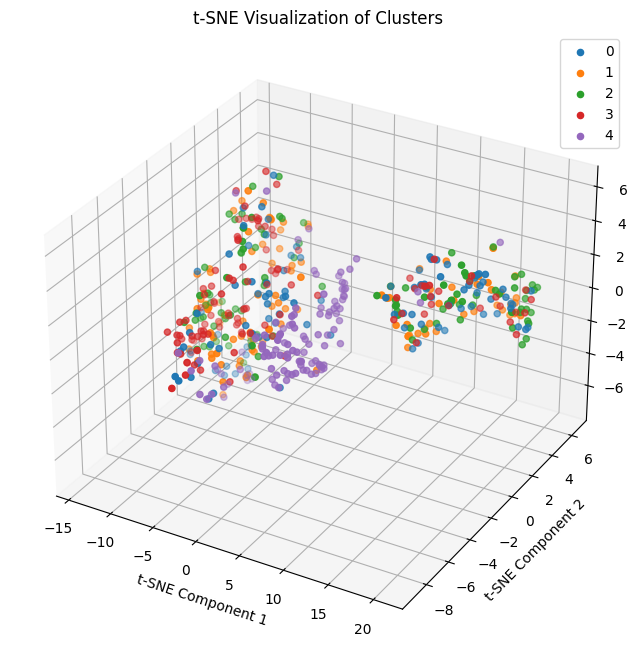

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE

# Perform t-SNE
tsne = TSNE(n_components=3, random_state=42)
tsne_features = tsne.fit_transform(add_data)

# Visualize clusters in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for label in set(y_train):
    indices = (y_train == label)
    ax.scatter(tsne_features[indices, 0], tsne_features[indices, 1], tsne_features[indices, 2], label=label)

ax.set_title('t-SNE Visualization of Clusters')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
ax.legend()
plt.show()


CLassification testing

concatenated embeddings

ADDING AND CONCATENATING INDIC BERT AND MULTI LINGUAL BERT

In [ ]:
Indic_bert_train
Indic_bert_test
bert_train
bert_test

array([[-0.43849048, -0.0260423 ,  0.3044438 , ...,  0.03605967,
         0.20833725, -0.47058055],
       [-0.4369686 ,  0.16865088,  0.15854058, ..., -0.04639361,
         0.21377023,  0.00914576],
       [-0.25518218, -0.23458952,  0.12802728, ..., -0.25165513,
        -0.00933775, -0.48840785],
       ...,
       [-0.25970268,  0.10015788,  0.13775744, ...,  0.03476274,
         0.12575532, -0.00629394],
       [-0.45750847,  0.00457014,  0.29801688, ...,  0.01490854,
         0.21540259, -0.22850297],
       [-0.19933546,  0.07149724,  0.23377864, ..., -0.24584202,
         0.41958222, -0.20042245]], dtype=float32)

In [ ]:
concat_train_indic = np.concatenate((Indic_bert_train, bert_train), axis=1)
print(concat_train_indic.shape)

add_train_indic = np.add(Indic_bert_train, bert_train)
print(add_train_indic.shape)

(560, 1536)
(560, 768)


In [ ]:
concat_test_indic = np.concatenate((Indic_bert_test, bert_test), axis=1)
print(concat_test_indic.shape)

add_test_indic = np.add(Indic_bert_test, bert_test)
print(add_test_indic.shape)

(140, 1536)
(140, 768)


In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(concat_train_indic,concat_test_indic,y_train,y_test)
models

 97%|█████████▋| 28/29 [01:30<00:08,  8.19s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 287232
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 1536
[LightGBM] [Info] Start training from score -1.683546
[LightGBM] [Info] Start training from score -1.600549
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.583005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

100%|██████████| 29/29 [02:13<00:00,  4.61s/it]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
CalibratedClassifierCV,0.61,0.64,None,0.60,28.44
Perceptron,0.60,0.63,None,0.56,0.25
LinearSVC,0.60,0.62,None,0.59,7.86
PassiveAggressiveClassifier,0.59,0.61,None,0.57,0.56
RandomForestClassifier,0.59,0.61,None,0.57,1.28
SVC,0.59,0.61,None,0.57,0.42
LogisticRegression,0.59,0.61,None,0.57,0.51
XGBClassifier,0.57,0.60,None,0.55,34.53
SGDClassifier,0.56,0.59,None,0.55,0.25


In [ ]:
clf = LazyClassifier(verbose=0,ignore_warnings=True,custom_metric=None)
models,predictions=clf.fit(add_train_indic,add_test_indic,y_train,y_test)
models

 97%|█████████▋| 28/29 [00:43<00:03,  3.68s/it]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 143616
[LightGBM] [Info] Number of data points in the train set: 560, number of used features: 768
[LightGBM] [Info] Start training from score -1.683546
[LightGBM] [Info] Start training from score -1.600549
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.591738
[LightGBM] [Info] Start training from score -1.583005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

100%|██████████| 29/29 [01:04<00:00,  2.21s/it]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
CalibratedClassifierCV,0.61,0.65,None,0.59,14.57
PassiveAggressiveClassifier,0.62,0.64,None,0.61,0.34
SGDClassifier,0.61,0.63,None,0.58,0.14
NuSVC,0.61,0.63,None,0.60,0.21
LinearSVC,0.60,0.62,None,0.59,2.97
LogisticRegression,0.60,0.62,None,0.59,0.26
LGBMClassifier,0.59,0.61,None,0.58,20.92
SVC,0.57,0.59,None,0.56,0.23
Perceptron,0.56,0.59,None,0.55,0.14
